# A variational autoencoder

In [1]:
from __future__ import absolute_import
from __future__ import division
from __future__ import print_function

from tensorflow.keras.layers import Lambda, Input, Dense
#from tensorflow.keras.models import Model
from keras import Model

from tensorflow.keras.datasets import mnist
from tensorflow.keras.losses import mse, binary_crossentropy
from tensorflow.keras.utils import plot_model
from tensorflow.keras import backend as K
import tensorflow as tf

from keras.models import Sequential
from keras.layers import *
from keras import layers, models

def to_functional_model(seqmodel):
    input_layer = Input(batch_shape=seqmodel.layers[0].input_shape)
    prev_layer = input_layer
    for layer in seqmodel.layers:
        prev_layer = layer(prev_layer)
    output_layer = prev_layer
    funcmodel = models.Model([input_layer], [prev_layer])
    return input_layer, output_layer, funcmodel

def sampling(args):
    """Reparameterization trick by sampling from an isotropic unit Gaussian.
    # Arguments:
        args (tensor): mean and log of variance of Q(z|X)
    # Returns:
        z (tensor): sampled latent vector
    """
    z_mean, z_log_var = args
    batch = K.shape(z_mean)[0]
    dim = K.int_shape(z_mean)[1]
    epsilon = K.random_normal(shape=(batch, dim))
    return z_mean + K.exp(0.5 * z_log_var) * epsilon

def get_vae_loss(inputs, outputs, z_mean, z_log_var, reconstruction_loss = "mse", original_dim = 130, impact_reconstruction_loss = 1, impact_kl_loss = 1):
    # VAE loss = mse_loss or binary_crossentropy + kl_loss
    if reconstruction_loss == "binary_crossentropy":
        reconstruction_loss = binary_crossentropy(inputs,outputs)
    elif reconstruction_loss == "mse":
        reconstruction_loss = mse(inputs, outputs)

    reconstruction_loss *= original_dim
    
    kl_loss = 1 + z_log_var - K.square(z_mean) - K.exp(z_log_var)
    kl_loss = K.sum(kl_loss, axis=-1)
    kl_loss *= -0.5
    vae_loss = K.mean(K.mean(impact_reconstruction_loss*reconstruction_loss) + impact_kl_loss * K.mean(kl_loss))
    return vae_loss

def image_encoder():
    image_model = Sequential()
    image_model.add(Conv2D(32, (8, 8), subsample=(4, 4), input_shape=[50, 50, 1], activation = "relu"))
    image_model.add(Conv2D(64, (4, 4), subsample=(2, 2), activation = "relu"))
    image_model.add(Conv2D(64, (3, 3), subsample=(1, 1), activation = "relu"))
    image_model.add(Flatten())
    image_model.add(Dense(512, activation = "relu"))
    image_model.add(Dense(256, activation = "relu"))
    image_model.add(Dense(64, activation = "relu"))

    image_input, image_output, image_model = to_functional_model(image_model)
    return image_input, image_output

def encoder():
    image_input, image_output = image_encoder()
    z_mean = Dense(2, name='z_mean')(image_output)
    z_log_var = Dense(2, name='z_log_var')(image_output)
    z = Lambda(sampling, output_shape=(2,), name='z')([z_mean, z_log_var])
    return image_input, [z_mean, z_log_var, z]

def image_decoder(encoded):
    shape = [-1,16,16, 1]
    x = Dense(64, activation = "relu")(encoded)
    x = Dense(256, activation = "relu")(x)
    x = Dense(512, activation = "relu")(x)
    x = Reshape((shape[1], shape[2], shape[3]))(x)
    x = layers.Conv2D(8, (6, 6), activation='relu', padding = "same")(x)
    x = layers.UpSampling2D((2, 2))(x)
    x = layers.Conv2D(5, (6, 6), activation='relu')(x)
    x = layers.UpSampling2D((2, 2))(x)
    x = layers.Conv2D(1, (5, 5), activation='relu')(x)
    return x


def decoder():
    latent_inputs = Input(shape=(2,), name='z_sampling')
    image_decoded = image_decoder(latent_inputs)
    return latent_inputs, image_decoded

Using TensorFlow backend.


In [2]:
image_input, [z_mean, z_log_var, z] = encoder()
latent_inputs, image_decoded = decoder()
encoder_model = Model(inputs = image_input, outputs = [z_mean, z_log_var, z], name = "encoder")
decoder_model = Model(inputs = latent_inputs, outputs = image_decoded, name='decoder')

/home/elerator/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:58: UserWarning: Update your `Conv2D` call to the Keras 2 API: `Conv2D(32, (8, 8), input_shape=[50, 50, 1..., activation="relu", strides=(4, 4))`
/home/elerator/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:59: UserWarning: Update your `Conv2D` call to the Keras 2 API: `Conv2D(64, (4, 4), activation="relu", strides=(2, 2))`
/home/elerator/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:60: UserWarning: Update your `Conv2D` call to the Keras 2 API: `Conv2D(64, (3, 3), activation="relu", strides=(1, 1))`


In [3]:
image_decoded.shape

TensorShape([None, 50, 50, 1])

In [4]:
image_decoded = decoder_model(encoder_model(image_input)[2])

In [5]:
vae = Model(inputs = image_input, outputs = image_decoded, name='vae_cnn')

In [6]:
import keras
vae.add_loss(get_vae_loss(image_input, image_decoded, z_mean, z_log_var, impact_reconstruction_loss = 1, impact_kl_loss = 0))
vae.compile(optimizer = "adam")

/home/elerator/anaconda3/lib/python3.7/site-packages/keras/engine/training_utils.py:819: UserWarning: Output decoder missing from loss dictionary. We assume this was done on purpose. The fit and evaluate APIs will not be expecting any data to be passed to decoder.
  'be expecting any data to be passed to {0}.'.format(name))


# Load dataset

In [7]:
import numpy as np
import os
from sklearn.model_selection import train_test_split

dataset_folder = "texture_datasets"
source_patches = np.load(os.path.join(dataset_folder,"source_patches.npy"))
labels = np.load(os.path.join(dataset_folder,"labels.npy"))

In [8]:
x_train, x_test, y_train, y_test = train_test_split(source_patches, labels, test_size = 0.2, random_state=42)

In [9]:
x_train = np.expand_dims(x_train, -1)
y_train = np.expand_dims(y_train, -1)

In [10]:
x_train.shape

(35528, 50, 50, 1)

In [11]:
batch_size = 100

In [ ]:
history = vae.fit(x_train[:1000], epochs = 200, batch_size=batch_size, verbose=1)

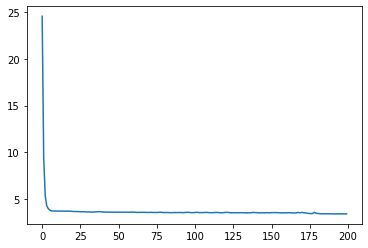

In [13]:
import matplotlib.pyplot as plt
plt.plot(vae.history.history["loss"])

In [43]:
history = vae.fit(x_train[1000:2000], epochs=epochs, batch_size=batch_size, verbose=1)

Epoch 1/400
1000/1000 [==============================] - 3s 3ms/step - loss: 3.3596
Epoch 2/400
1000/1000 [==============================] - 3s 3ms/step - loss: 3.3547
Epoch 3/400
1000/1000 [==============================] - 3s 3ms/step - loss: 3.3563
Epoch 4/400
1000/1000 [==============================] - 2s 2ms/step - loss: 3.3520
Epoch 5/400
1000/1000 [==============================] - 4s 4ms/step - loss: 3.3468
Epoch 6/400
1000/1000 [==============================] - 2s 2ms/step - loss: 3.3486
Epoch 7/400
1000/1000 [==============================] - 2s 2ms/step - loss: 3.3538
Epoch 8/400
1000/1000 [==============================] - 3s 3ms/step - loss: 3.3560
Epoch 9/400
1000/1000 [==============================] - 2s 2ms/step - loss: 3.3494
Epoch 10/400
1000/1000 [==============================] - 3s 3ms/step - loss: 3.3478
Epoch 11/400
1000/1000 [==============================] - 2s 2ms/step - loss: 3.3500
Epoch 12/400
1000/1000 [==============================] - 2s 2ms/step - lo

1000/1000 [==============================] - 1s 1ms/step - loss: 3.3199
Epoch 193/400
1000/1000 [==============================] - 2s 2ms/step - loss: 3.3253
Epoch 194/400
1000/1000 [==============================] - 2s 2ms/step - loss: 3.3399
Epoch 195/400
1000/1000 [==============================] - 2s 2ms/step - loss: 3.3186
Epoch 196/400
1000/1000 [==============================] - 1s 1ms/step - loss: 3.3085
Epoch 197/400
1000/1000 [==============================] - 1s 1ms/step - loss: 3.3077
Epoch 198/400
1000/1000 [==============================] - 2s 2ms/step - loss: 3.3067
Epoch 199/400
1000/1000 [==============================] - 1s 1ms/step - loss: 3.3055
Epoch 200/400
1000/1000 [==============================] - 1s 1ms/step - loss: 3.3051
Epoch 201/400
1000/1000 [==============================] - 1s 1ms/step - loss: 3.3058
Epoch 202/400
1000/1000 [==============================] - 1s 1ms/step - loss: 3.3036
Epoch 203/400
1000/1000 [==============================] - 1s 1ms/st

1000/1000 [==============================] - 1s 1ms/step - loss: 3.2716
Epoch 383/400
1000/1000 [==============================] - 1s 1ms/step - loss: 3.2699
Epoch 384/400
1000/1000 [==============================] - 1s 1ms/step - loss: 3.2693
Epoch 385/400
1000/1000 [==============================] - 2s 2ms/step - loss: 3.2692
Epoch 386/400
1000/1000 [==============================] - 1s 1ms/step - loss: 3.2663
Epoch 387/400
1000/1000 [==============================] - 1s 1ms/step - loss: 3.2678
Epoch 388/400
1000/1000 [==============================] - 1s 1ms/step - loss: 3.2774
Epoch 389/400
1000/1000 [==============================] - 1s 1ms/step - loss: 3.2764
Epoch 390/400
1000/1000 [==============================] - 2s 2ms/step - loss: 3.2849
Epoch 391/400
1000/1000 [==============================] - 1s 1ms/step - loss: 3.2750
Epoch 392/400
1000/1000 [==============================] - 1s 1ms/step - loss: 3.2677
Epoch 393/400
1000/1000 [==============================] - 1s 1ms/st

In [ ]:
history = vae.fit(x_train, epochs = 70, batch_size=batch_size, verbose=1)

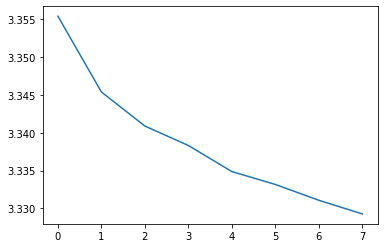

In [45]:
plt.plot(vae.history.history["loss"])

In [46]:
# train the autoencoder
#history = vae.fit(x_train, epochs=epochs, batch_size=batch_size, verbose=1)

In [47]:
from scipy.stats import gaussian_kde

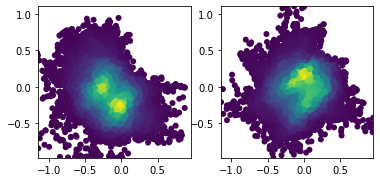

In [89]:
fig, ax = plt.subplots(1,2)

res_pos_ex = encoder_model.predict(x_train[y_train[:,0]])[2]
xy = np.vstack([res_pos_ex.T[0], res_pos_ex.T[1]])
z = gaussian_kde(xy)(xy)
ax[0].scatter(res_pos_ex.T[0], res_pos_ex.T[1], c = z, edgecolor = "")
xrange = [np.min(res_pos_ex.T[0]), np.max(res_pos_ex.T[0])]
yrange = [np.min(res_pos_ex.T[1]), np.max(res_pos_ex.T[1])]


res_neg_ex = encoder_model.predict(x_train[~y_train[:,0]])[2]
xy = np.vstack([res_neg_ex.T[0], res_neg_ex.T[1]])
z = gaussian_kde(xy)(xy)
ax[1].scatter(res_neg_ex.T[0], res_neg_ex.T[1], c = z, edgecolor = "")
xrange = [np.min(res_neg_ex.T[0]), np.max(res_neg_ex.T[0])]
yrange = [np.min(res_neg_ex.T[1]), np.max(res_neg_ex.T[1])]


ax[0].set_xlim(xrange)
ax[0].set_ylim(yrange)
ax[0].set_aspect(1)

ax[1].set_xlim(xrange)
ax[1].set_ylim(yrange)
ax[1].set_aspect(1)

res = encoder_model.predict(x_train)[2]
xrange = [np.percentile(res.T[0], 1), np.percentile(res.T[0], 99)]
yrange = [np.percentile(res.T[1], 1), np.percentile(res.T[1], 99)]

In [328]:
nbins = 25
bins = [np.linspace(xrange[0],xrange[1], nbins), np.linspace(yrange[0], yrange[1], nbins)]
pos, neg = [np.histogram2d(res_neg_ex.T[0], res_neg_ex.T[1], bins = bins, density = False), 
                            np.histogram2d(res_pos_ex.T[0], res_pos_ex.T[1], bins = bins, density = False)]

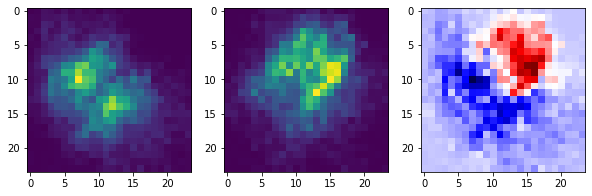

In [329]:
fig, ax = plt.subplots(1, 3, figsize = (10,10))
ax[1].imshow(np.flipud(pos[0]), cmap = "viridis")
ax[0].imshow(np.flipud(neg[0]), cmap = "viridis")
ax[2].imshow(np.flipud(pos[0]-neg[0]), cmap = "seismic")

In [117]:
pos[0].shape

(49, 49)

In [49]:
#res = encoder_model.predict(x_train)[2]

(-0.704691241979599, 0.6426366043090841)

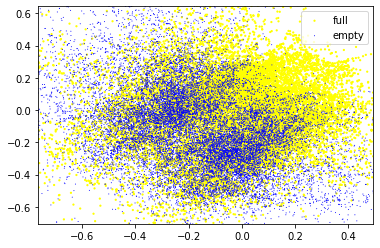

In [50]:
fig, ax = plt.subplots(1)

ax.scatter(res.T[0][~y_train[:,0]], res.T[1][~y_train[:,0]], c = "yellow", edgecolor = "", s = 5, label = "full")
ax.scatter(res.T[0][y_train[:,0]], res.T[1][y_train[:,0]], c = "blue", edgecolor = "", s = 1, label = "empty")
ax.legend()

xrange = [np.percentile(res.T[0], 1), np.percentile(res.T[0], 99)]
yrange = [np.percentile(res.T[1], 1), np.percentile(res.T[1], 99)]
ax.set_xlim(xrange)
ax.set_ylim(yrange)

In [51]:
def fig2rgb_array(fig):
    """ Converts a matplotlib figure to an rgb array such that it may be displayed as an ImageDisplay
    Args:
        fig: Matplotlib figure
    Returns:
        arr: Image of the plot in the form of a numpy array
    """
    fig.canvas.draw()
    buf = fig.canvas.tostring_rgb()
    ncols, nrows = fig.canvas.get_width_height()
    return np.fromstring(buf, dtype=np.uint8).reshape(nrows, ncols, 3)

In [52]:
n = 25
xs = np.linspace(xrange[0],xrange[1],n)
ys = np.linspace(yrange[0],yrange[1],n)

In [53]:
test = np.array([[0,0,0],[0,0,0]]).T

/home/elerator/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:11: DeprecationWarning: The binary mode of fromstring is deprecated, as it behaves surprisingly on unicode inputs. Use frombuffer instead
  # This is added back by InteractiveShellApp.init_path()


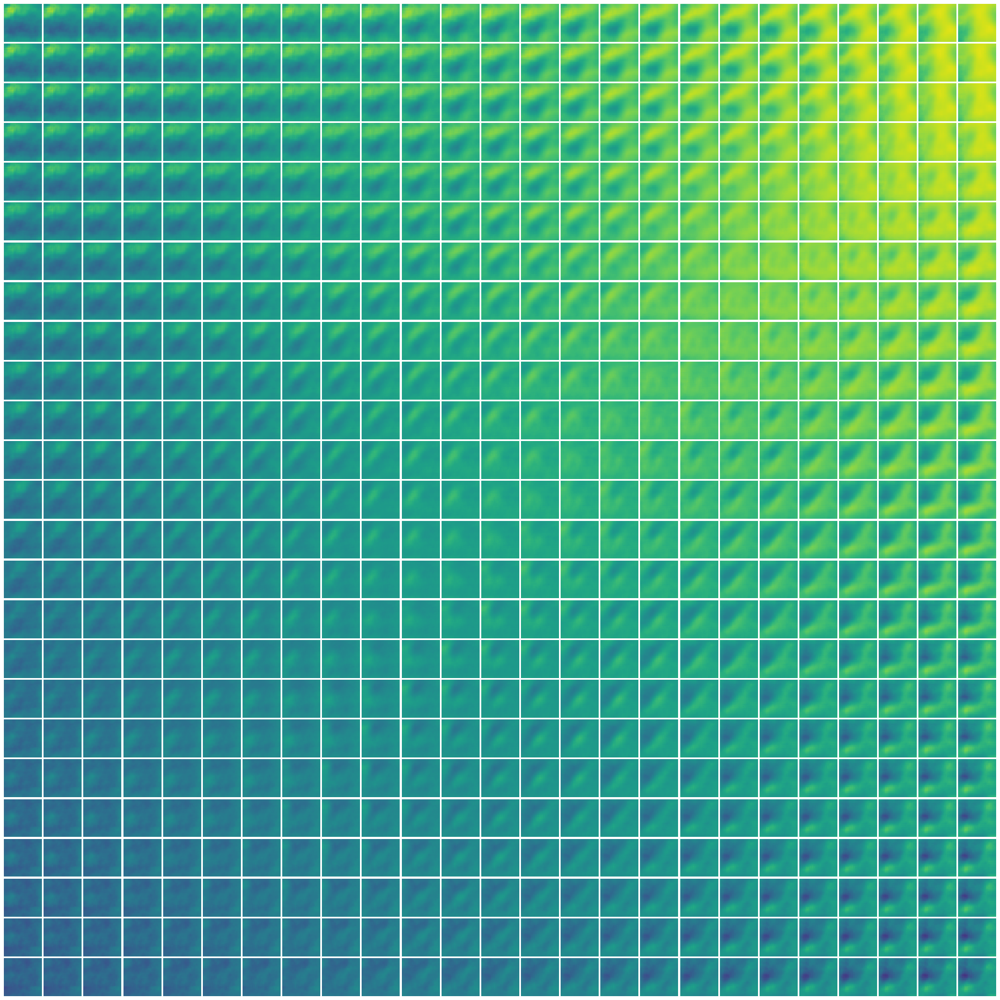

In [54]:
fig, ax = plt.subplots(n,n, figsize= (n,n))
plt.subplots_adjust(0,0,1,1,.05,.05)
for i in range(len(list(ax))):
    for i1 in range(len(list(ax)[0])):
        ax[i, i1].axis("off")
        curr_y, curr_x = xs[i1], ys[len(ys)-1-i]
        pred = decoder_model.predict(np.array([[curr_y,  curr_x]]))[0,:,:,0]
        ax[i, i1].imshow(pred, vmin = .25, vmax = .75)
manifold = fig2rgb_array(fig)

[-0.8, -0.5, -0.3, -0.0, 0.2, 0.5]


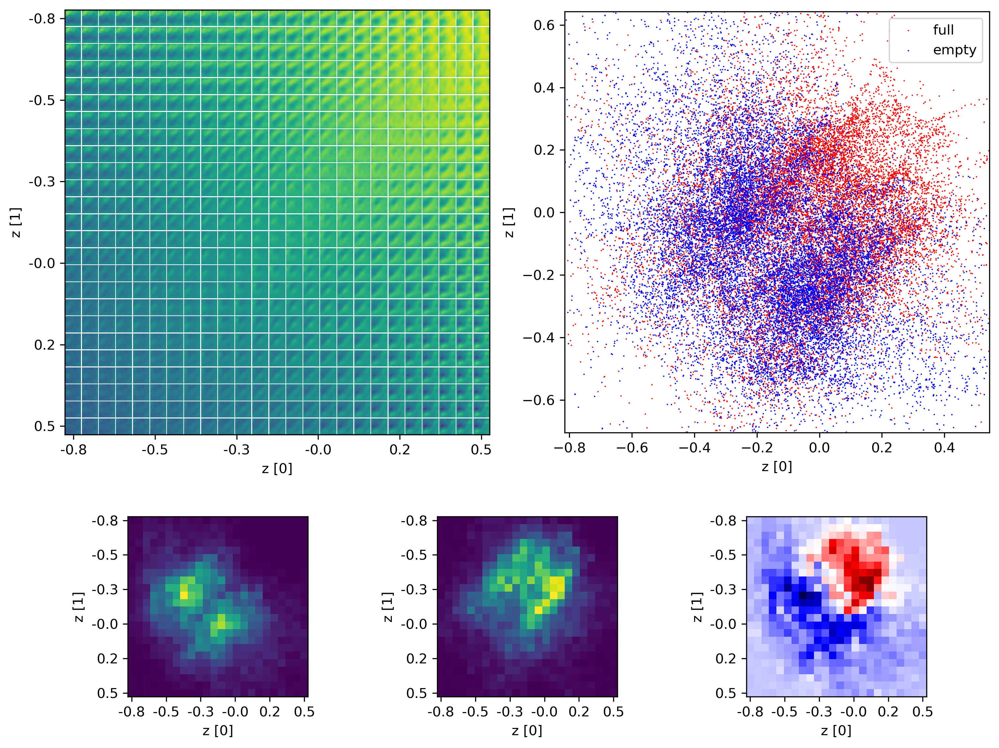

In [417]:
fig = plt.figure(constrained_layout=True, figsize = (10,8), dpi = 300)
gs = fig.add_gridspec(nrows=4, ncols=6, left=0.0, right=1, wspace = 0, hspace = 0)
ax = []
ax.append(fig.add_subplot(gs[:3, :3]))
ax.append(fig.add_subplot(gs[:3, 3:]))
ax.append(fig.add_subplot(gs[3, 0:2]))
ax.append(fig.add_subplot(gs[3, 2:4]))
ax.append(fig.add_subplot(gs[3, 4:6]))
#fig, ax = plt.subplots(1,2, figsize = (10,10), dpi = 300)

xrange = [np.percentile(res.T[0], 1), np.percentile(res.T[0], 99)]
yrange = [np.percentile(res.T[1], 1), np.percentile(res.T[1], 99)]
ax[1].set_xlim(xrange[0]-.05,xrange[1]+.05)
ax[1].set_ylim(yrange)

ax[1].scatter(res.T[0][~y_train[:,0]], res.T[1][~y_train[:,0]], c = "red", edgecolor = "", s = 1, label = "full")
ax[1].scatter(res.T[0][y_train[:,0]], res.T[1][y_train[:,0]], c = "blue", edgecolor = "", s = 1, label = "empty")
ax[1].legend()

ax[0].imshow(manifold)
ax[0].set_aspect(1)

ax[0].set_xticks(np.linspace(manifold.shape[0]/25/2, manifold.shape[0]-manifold.shape[0]/25/2, 6))
ax[0].set_yticks(np.linspace(manifold.shape[0]/25/2, manifold.shape[0]-manifold.shape[0]/25/2, 6))
print([np.round(x,1) for x in np.linspace(xrange[0], xrange[1], 6)])
ax[0].set_xticklabels([np.round(x,1) for x in np.linspace(xrange[0], xrange[1], 6)])
ax[0].set_yticklabels([np.round(x,1) for x in np.linspace(xrange[0], xrange[1], 6)])

ax[0].set_aspect(1)
ax[1].set_aspect(1)


for i, a in enumerate(ax):
    a.set_xlabel("z [0]")
    a.set_ylabel("z [1]")
    if i > 1:
        a.set_xticks(np.linspace(0, 23, 6))
        a.set_yticks(np.linspace(0, 23, 6))
        a.set_xticklabels([np.round(x,1) for x in np.linspace(xrange[0], xrange[1], 6)])
        a.set_yticklabels([np.round(x,1) for x in np.linspace(xrange[0], xrange[1], 6)])

ax[3].imshow(np.flipud(pos[0]), cmap = "viridis")
ax[2].imshow(np.flipud(neg[0]), cmap = "viridis")
ax[4].imshow(np.flipud(pos[0] - neg[0]), cmap = "seismic")

In [259]:
from PIL import Image
from sklearn.feature_extraction.image import extract_patches_2d

arr = np.array(Image.open("texture_samples/0.png"))[200:225, :]
windows = extract_patches_2d(arr, (25,25))

In [260]:
len(windows)

428

# 2D Fourier transform

In [261]:
from scipy.ndimage import gaussian_filter
sigma = 1
phases = np.array([gaussian_filter(np.log(np.abs(np.fft.fft2(w).imag)+1), sigma) for w in windows])

In [262]:
phases -= np.mean(phases, axis = 0)

In [263]:
%%capture
def init_fig():
    fig, ax = plt.subplots(1, figsize = (8,8))
    i = 0
    im = ax.imshow(phases[i], cmap ="viridis")
    ax.axis("off")
    return fig, im

def get_animate(im):
    def animate(i):
        im.set_array(phases[i])
    return animate
init_fig()

In [266]:
%%capture
import matplotlib.animation as anim
from IPython.core.display import display, HTML
fig, im = init_fig()
ani = anim.FuncAnimation(fig, get_animate(im), frames = 400, interval = 50)

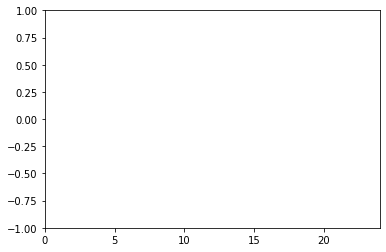

In [299]:
import matplotlib
def plot_animation(vectors, i_min = 0, n_frames = 100):
    if vectors[0].ndim == 1:
        vectors = np.expand_dims(vectors, 1)
    fig = plt.figure()

    if np.any(np.array(vectors) < 0):
        ylim=(-1, 1)
    else:
        ylim = (0, np.max(vectors[i_min:i_min+n_frames]))

    xmax = len(vectors[0,0])-1
    ax = plt.axes(xlim=(0, xmax), ylim = ylim)
    lines = []

    for i in range(vectors.shape[1]):
        line, = ax.plot([], [], lw=2)
        lines.append(line)

    # initialization function: plot the background of each frame
    def init():
        for i in range(len(lines)):
            lines[i].set_data([], [])
        return line,

    # animation function.  This is called sequentially
    def animate(i):
        data = np.array(vectors[i])
        for i1, y in enumerate(data):
            y = y / np.nanmax([np.nanmax(data), -np.nanmin(data)])
            x = np.arange(len(y))
            lines[i1].set_data(x, y)
        return lines

    # call the animator.  blit=True means only re-draw the parts that have changed.
    anim = matplotlib.animation.FuncAnimation(fig, animate, init_func=init,
                                   frames=n_frames, interval = 100, blit=True)
    return anim
ani = plot_animation([np.mean(phases[i][:,:12], axis= 1) for i in range(100)])

In [300]:
HTML(ani.to_jshtml())

In [267]:
HTML(ani.to_jshtml())